# AnoGAN 논문 구현  
- pytorch

## Packages and Modules

In [1]:
import os
import random
import time
import glob
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageFile
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchsummary import summary

In [2]:
%matplotlib inline

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

## GPU device

In [5]:
device = torch.device('cuda')
print(device)

cuda


## Load data and preprocessing

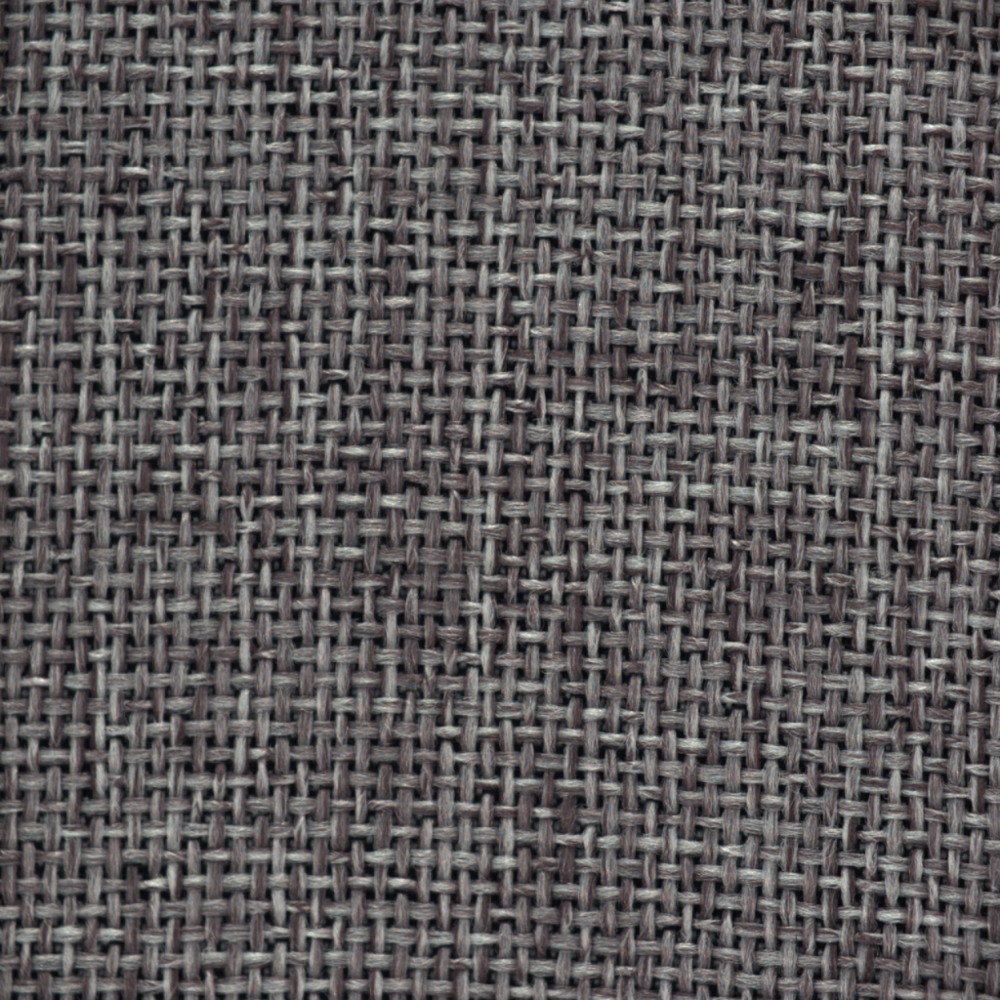

In [6]:
path = r'C:\Users\user\MY_DL\GAN\anogan_carpet\train\good\000.png'
Image.open(path)

In [7]:
latent_dim = 128
batch_size = 16
lr = 0.0002
target_size = (64,64)

In [8]:
# custom dataset
class ImageDataset(Dataset):
    def __init__(self, path, transforms_):
        self.transform = transforms.Compose(transforms_)
        self.files = glob.glob(path+'/**/*.png')
        
    def __getitem__(self, index):
        img = Image.open(self.files[index%len(self.files)])
        img = self.transform(img)
        return img
    
    def __len__(self):
        return len(self.files)

In [9]:
path = './anogan_carpet/train'

transforms_ = [
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5,)),
    transforms.Resize(target_size)
]

dataloader = DataLoader(
    ImageDataset(path, transforms_=transforms_),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True,
)

### Build Models

In [10]:
class Generator(nn.Module):
    def __init__(self, latent_dim=128, num_filters=32, out_channel=1):
        super(Generator, self).__init__()
        self.g_model = nn.Sequential(
            # input size is 128x1x1
            nn.ConvTranspose2d(latent_dim, num_filters*8, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(num_filters*8),
            nn.ReLU(),
            # output size is 256x4x4
        
            nn.ConvTranspose2d(num_filters*8, num_filters*4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*4),
            nn.ReLU(),
            # output size is 128x8x8
        
            nn.ConvTranspose2d(num_filters*4, num_filters*2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*2),
            nn.ReLU(),
            # output size is 64x16x16
            
            nn.ConvTranspose2d(num_filters*2, num_filters, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters),
            nn.ReLU(),
            # output size is 32x32x32
        
            nn.ConvTranspose2d(num_filters, out_channel, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
            # output size is 1x64x64
        )
        
    def forward(self, x):
        return self.g_model(x)

In [11]:
# generator summary
g_model = Generator().to(device)
summary(g_model, (128,1,1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 256, 4, 4]         524,544
       BatchNorm2d-2            [-1, 256, 4, 4]             512
              ReLU-3            [-1, 256, 4, 4]               0
   ConvTranspose2d-4            [-1, 128, 8, 8]         524,416
       BatchNorm2d-5            [-1, 128, 8, 8]             256
              ReLU-6            [-1, 128, 8, 8]               0
   ConvTranspose2d-7           [-1, 64, 16, 16]         131,136
       BatchNorm2d-8           [-1, 64, 16, 16]             128
              ReLU-9           [-1, 64, 16, 16]               0
  ConvTranspose2d-10           [-1, 32, 32, 32]          32,800
      BatchNorm2d-11           [-1, 32, 32, 32]              64
             ReLU-12           [-1, 32, 32, 32]               0
  ConvTranspose2d-13            [-1, 1, 64, 64]             513
             Tanh-14            [-1, 1,

In [12]:
class Discriminator(nn.Module):
    def __init__(self, in_dim=1, num_filters=32):
        super(Discriminator, self).__init__()
        self.feature_layer = nn.Sequential(
            # input size is 1x64x64
            nn.Conv2d(in_dim, num_filters, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters),
            nn.LeakyReLU(0.2, inplace=True),
            # output size is 32x32x32
            
            nn.Conv2d(num_filters, num_filters*2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*2),
            nn.LeakyReLU(0.2, inplace=True),
            # output size is 64x16x16
            
            nn.Conv2d(num_filters*2, num_filters*4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*4),
            nn.LeakyReLU(0.2, inplace=True),
            # output size is 128x8x8
            
            nn.Conv2d(num_filters*4, num_filters*8, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(num_filters*8),
            nn.LeakyReLU(0.2, inplace=True),
            # output size is 256x4x4
        )
        self.out_layer = nn.Sequential(
            nn.Conv2d(num_filters*8, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid(),
            # output size is 1x1x1
        )
        
    def extract_feature(self, x):
        return self.feature_layer(x)
    
    def forward(self, x):
        x = self.feature_layer(x)
        out = self.out_layer(x)
        return out.view(-1,1)

In [13]:
# discriminator summary
d_model = Discriminator().to(device)
summary(d_model, (1,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 32, 32]             544
       BatchNorm2d-2           [-1, 32, 32, 32]              64
         LeakyReLU-3           [-1, 32, 32, 32]               0
            Conv2d-4           [-1, 64, 16, 16]          32,832
       BatchNorm2d-5           [-1, 64, 16, 16]             128
         LeakyReLU-6           [-1, 64, 16, 16]               0
            Conv2d-7            [-1, 128, 8, 8]         131,200
       BatchNorm2d-8            [-1, 128, 8, 8]             256
         LeakyReLU-9            [-1, 128, 8, 8]               0
           Conv2d-10            [-1, 256, 4, 4]         524,544
      BatchNorm2d-11            [-1, 256, 4, 4]             512
        LeakyReLU-12            [-1, 256, 4, 4]               0
           Conv2d-13              [-1, 1, 1, 1]           4,097
          Sigmoid-14              [-1, 

In [14]:
# weight 초기화
def weights_init(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(model.weight, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(model.weight, 1.0, 0.02)
        torch.nn.init.zeros_(model.bias)

In [15]:
# assign gpu operation
generator = Generator().to(device)
discriminator = Discriminator().to(device)
generator.apply(weights_init)
discriminator.apply(weights_init)

Discriminator(
  (feature_layer): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (out_layer): Sequential(
    (0): Conv2d(256, 1, kernel_size=(4, 4), strid

In [16]:
# set loss function and optimizer
gen_optim = optim.Adam(generator.parameters(), lr=lr, weight_decay=1e-5, betas=(0.5,0.999))
dis_optim = optim.Adam(discriminator.parameters(), lr=lr, weight_decay=1e-5, betas=(0.5,0.999))

loss_func = nn.BCELoss().to(device)

In [17]:
# define function for showing generated images
def plot_generated_images(fake_images, epoch, every):
    if epoch%every==0:
        plt.figure(figsize=(15,5))
        images = np.transpose(vutils.make_grid(fake_images.to(device), 
                                               padding=3, 
                                               normalize=True).cpu(), (1,2,0))
        plt.imshow(images)
        plt.axis('off')
        plt.show()

In [18]:
# set epochs
n_epochs = 100

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/100, time: 9.792931079864502s
Discriminator loss: 1.0574716329574585, Generator loss: 3.757476568222046
--------------------------------------------------------------------------------
Epoch 2/100, time: 9.381723403930664s
Discriminator loss: 0.9832271933555603, Generator loss: 5.550381660461426
--------------------------------------------------------------------------------
Epoch 3/100, time: 9.547230005264282s
Discriminator loss: 0.6738646030426025, Generator loss: 6.059179782867432
--------------------------------------------------------------------------------
Epoch 4/100, time: 9.542698860168457s
Discriminator loss: 0.9470547437667847, Generator loss: 6.824118614196777
--------------------------------------------------------------------------------
Epoch 5/100, time: 9.578964948654175s
Discriminator loss: 0.8239316344261169, Generator loss: 5.105838298797607
--------------------------------------------------------------------------------


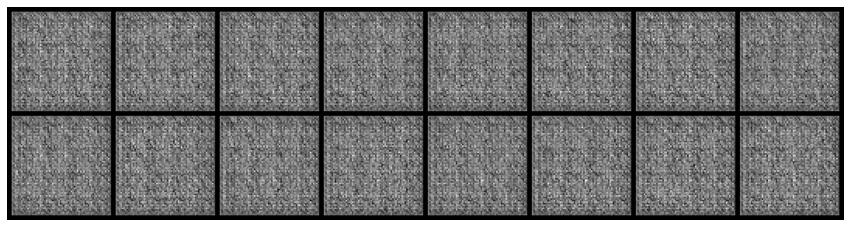

Epoch 6/100, time: 9.36545991897583s
Discriminator loss: 0.3524967133998871, Generator loss: 6.077404022216797
--------------------------------------------------------------------------------
Epoch 7/100, time: 9.277332544326782s
Discriminator loss: 0.6072267889976501, Generator loss: 5.789441108703613
--------------------------------------------------------------------------------
Epoch 8/100, time: 9.248146295547485s
Discriminator loss: 0.5277796983718872, Generator loss: 5.416607856750488
--------------------------------------------------------------------------------
Epoch 9/100, time: 9.286219835281372s
Discriminator loss: 0.18798606097698212, Generator loss: 4.817146301269531
--------------------------------------------------------------------------------
Epoch 10/100, time: 9.235831260681152s
Discriminator loss: 0.2993805408477783, Generator loss: 4.953135967254639
--------------------------------------------------------------------------------


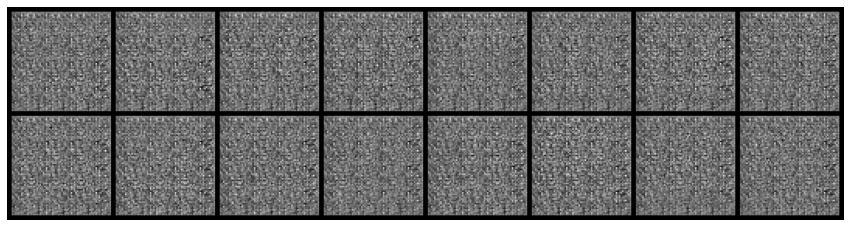

Epoch 11/100, time: 9.194217443466187s
Discriminator loss: 0.18984821438789368, Generator loss: 5.3806867599487305
--------------------------------------------------------------------------------
Epoch 12/100, time: 9.159263849258423s
Discriminator loss: 0.30984941124916077, Generator loss: 5.172516822814941
--------------------------------------------------------------------------------
Epoch 13/100, time: 9.269250631332397s
Discriminator loss: 0.3039218783378601, Generator loss: 4.494271278381348
--------------------------------------------------------------------------------
Epoch 14/100, time: 9.131043672561646s
Discriminator loss: 0.2838670611381531, Generator loss: 4.510638236999512
--------------------------------------------------------------------------------
Epoch 15/100, time: 9.129580020904541s
Discriminator loss: 0.42702817916870117, Generator loss: 5.428274154663086
--------------------------------------------------------------------------------


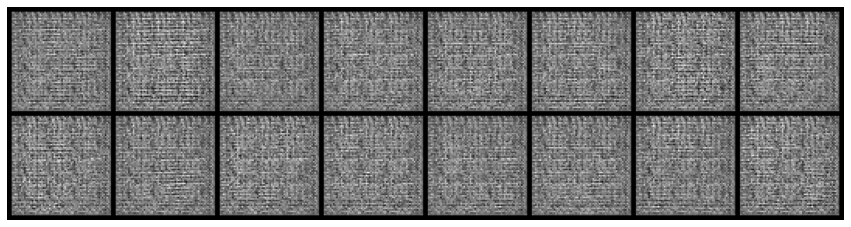

Epoch 16/100, time: 9.123623132705688s
Discriminator loss: 0.2707740366458893, Generator loss: 5.6656174659729
--------------------------------------------------------------------------------
Epoch 17/100, time: 9.08307695388794s
Discriminator loss: 0.13217903673648834, Generator loss: 4.690893173217773
--------------------------------------------------------------------------------
Epoch 18/100, time: 9.054265022277832s
Discriminator loss: 0.19489909708499908, Generator loss: 4.78702974319458
--------------------------------------------------------------------------------
Epoch 19/100, time: 9.08672571182251s
Discriminator loss: 0.22523000836372375, Generator loss: 5.3796844482421875
--------------------------------------------------------------------------------
Epoch 20/100, time: 9.090056657791138s
Discriminator loss: 0.545783519744873, Generator loss: 5.389056205749512
--------------------------------------------------------------------------------


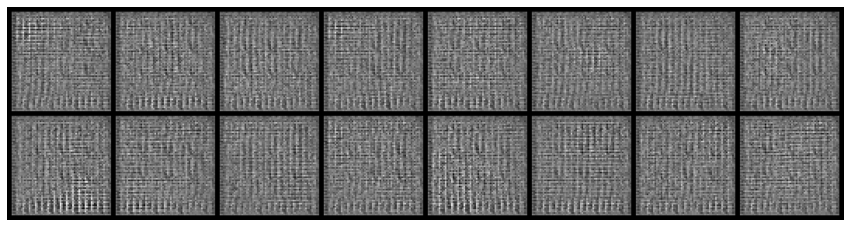

Epoch 21/100, time: 9.072622776031494s
Discriminator loss: 0.39671918749809265, Generator loss: 6.640970230102539
--------------------------------------------------------------------------------
Epoch 22/100, time: 9.167013168334961s
Discriminator loss: 0.874976634979248, Generator loss: 5.450578689575195
--------------------------------------------------------------------------------
Epoch 23/100, time: 9.048999071121216s
Discriminator loss: 0.18481475114822388, Generator loss: 5.263378143310547
--------------------------------------------------------------------------------
Epoch 24/100, time: 9.04677438735962s
Discriminator loss: 0.619915246963501, Generator loss: 5.1274495124816895
--------------------------------------------------------------------------------
Epoch 25/100, time: 9.046565055847168s
Discriminator loss: 0.22494325041770935, Generator loss: 5.00853157043457
--------------------------------------------------------------------------------


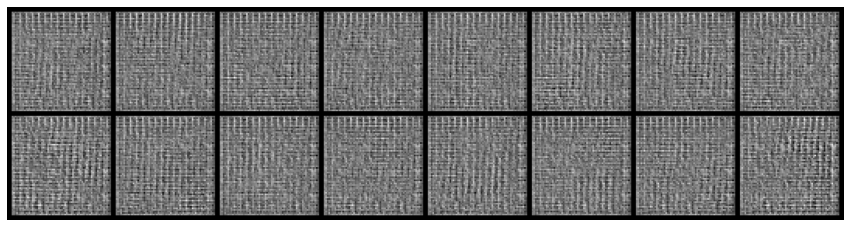

Epoch 26/100, time: 9.0530424118042s
Discriminator loss: 0.3181758522987366, Generator loss: 5.5104522705078125
--------------------------------------------------------------------------------
Epoch 27/100, time: 9.047259092330933s
Discriminator loss: 0.15195365250110626, Generator loss: 5.830809593200684
--------------------------------------------------------------------------------
Epoch 28/100, time: 9.041063070297241s
Discriminator loss: 0.1259872317314148, Generator loss: 4.814084529876709
--------------------------------------------------------------------------------
Epoch 29/100, time: 9.418198347091675s
Discriminator loss: 0.2232917845249176, Generator loss: 5.298181533813477
--------------------------------------------------------------------------------
Epoch 30/100, time: 9.245616436004639s
Discriminator loss: 0.21682731807231903, Generator loss: 5.157932758331299
--------------------------------------------------------------------------------


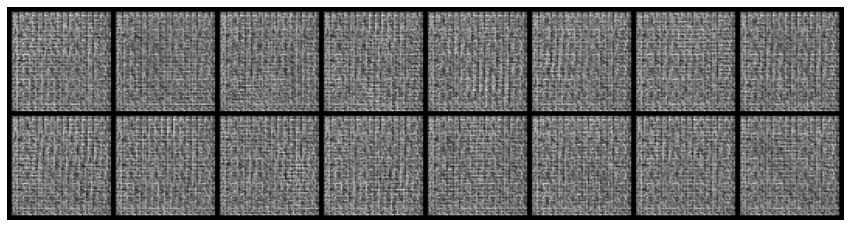

Epoch 31/100, time: 9.121588706970215s
Discriminator loss: 0.11351834237575531, Generator loss: 4.705653190612793
--------------------------------------------------------------------------------
Epoch 32/100, time: 9.24723219871521s
Discriminator loss: 0.16171449422836304, Generator loss: 5.181875228881836
--------------------------------------------------------------------------------
Epoch 33/100, time: 9.071009874343872s
Discriminator loss: 0.04067171365022659, Generator loss: 8.070310592651367
--------------------------------------------------------------------------------
Epoch 34/100, time: 9.068280935287476s
Discriminator loss: 0.17043545842170715, Generator loss: 5.108606338500977
--------------------------------------------------------------------------------
Epoch 35/100, time: 9.1146559715271s
Discriminator loss: 0.07309025526046753, Generator loss: 8.195670127868652
--------------------------------------------------------------------------------


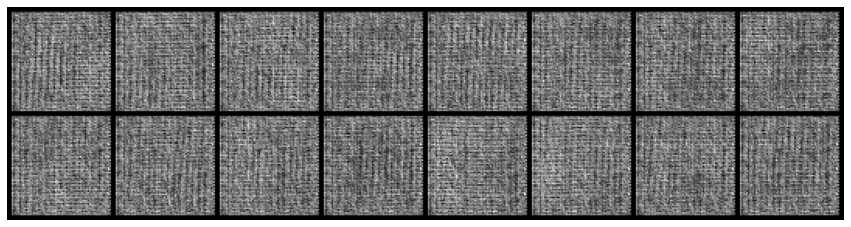

Epoch 36/100, time: 9.028040409088135s
Discriminator loss: 0.04050358012318611, Generator loss: 6.858003616333008
--------------------------------------------------------------------------------
Epoch 37/100, time: 9.008999109268188s
Discriminator loss: 1.3468462228775024, Generator loss: 7.557167053222656
--------------------------------------------------------------------------------
Epoch 38/100, time: 9.063999652862549s
Discriminator loss: 0.648283064365387, Generator loss: 7.902040481567383
--------------------------------------------------------------------------------
Epoch 39/100, time: 9.048002004623413s
Discriminator loss: 0.5391039848327637, Generator loss: 5.741978168487549
--------------------------------------------------------------------------------
Epoch 40/100, time: 9.189998626708984s
Discriminator loss: 0.652072548866272, Generator loss: 1.978190302848816
--------------------------------------------------------------------------------


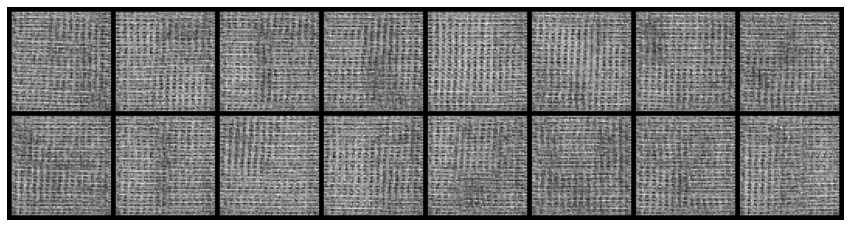

Epoch 41/100, time: 9.174999713897705s
Discriminator loss: 0.3855656683444977, Generator loss: 2.9336395263671875
--------------------------------------------------------------------------------
Epoch 42/100, time: 9.347001075744629s
Discriminator loss: 0.3980059325695038, Generator loss: 5.230072975158691
--------------------------------------------------------------------------------
Epoch 43/100, time: 9.313000679016113s
Discriminator loss: 0.4657883644104004, Generator loss: 5.082617282867432
--------------------------------------------------------------------------------
Epoch 44/100, time: 9.347489356994629s
Discriminator loss: 0.1505061537027359, Generator loss: 2.948429584503174
--------------------------------------------------------------------------------
Epoch 45/100, time: 9.149998903274536s
Discriminator loss: 0.20377559959888458, Generator loss: 4.329026222229004
--------------------------------------------------------------------------------


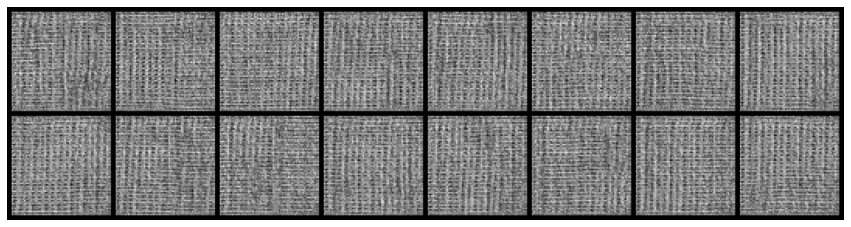

Epoch 46/100, time: 9.440589904785156s
Discriminator loss: 0.18458154797554016, Generator loss: 2.8495612144470215
--------------------------------------------------------------------------------
Epoch 47/100, time: 9.135688066482544s
Discriminator loss: 0.22023063898086548, Generator loss: 4.455289363861084
--------------------------------------------------------------------------------
Epoch 48/100, time: 9.273034572601318s
Discriminator loss: 0.35957425832748413, Generator loss: 2.2746963500976562
--------------------------------------------------------------------------------
Epoch 49/100, time: 9.2469961643219s
Discriminator loss: 0.2261301428079605, Generator loss: 4.323984146118164
--------------------------------------------------------------------------------
Epoch 50/100, time: 9.16299843788147s
Discriminator loss: 0.1367538422346115, Generator loss: 3.9864935874938965
--------------------------------------------------------------------------------


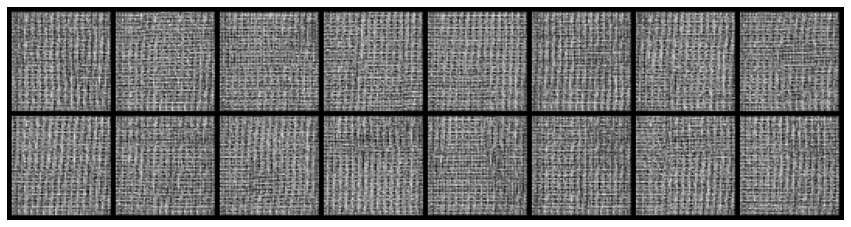

Epoch 51/100, time: 9.15276837348938s
Discriminator loss: 0.3497316539287567, Generator loss: 4.840090274810791
--------------------------------------------------------------------------------
Epoch 52/100, time: 9.136000394821167s
Discriminator loss: 0.32827824354171753, Generator loss: 3.9112892150878906
--------------------------------------------------------------------------------
Epoch 53/100, time: 9.10103988647461s
Discriminator loss: 0.12167122960090637, Generator loss: 3.7589542865753174
--------------------------------------------------------------------------------
Epoch 54/100, time: 9.160998106002808s
Discriminator loss: 0.19358386099338531, Generator loss: 4.707203388214111
--------------------------------------------------------------------------------
Epoch 55/100, time: 9.081997632980347s
Discriminator loss: 0.22314995527267456, Generator loss: 4.445610523223877
--------------------------------------------------------------------------------


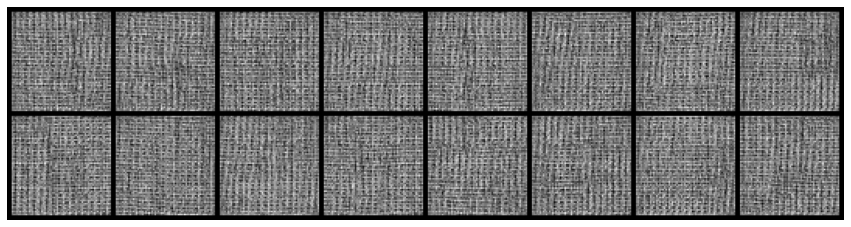

Epoch 56/100, time: 9.269100904464722s
Discriminator loss: 0.31882616877555847, Generator loss: 5.3606390953063965
--------------------------------------------------------------------------------
Epoch 57/100, time: 9.393139362335205s
Discriminator loss: 0.4774278402328491, Generator loss: 7.148692607879639
--------------------------------------------------------------------------------
Epoch 58/100, time: 9.171877145767212s
Discriminator loss: 0.225786954164505, Generator loss: 3.976034641265869
--------------------------------------------------------------------------------
Epoch 59/100, time: 8.9365074634552s
Discriminator loss: 0.33544185757637024, Generator loss: 6.58980131149292
--------------------------------------------------------------------------------
Epoch 60/100, time: 8.899998426437378s
Discriminator loss: 0.1848597675561905, Generator loss: 3.4019999504089355
--------------------------------------------------------------------------------


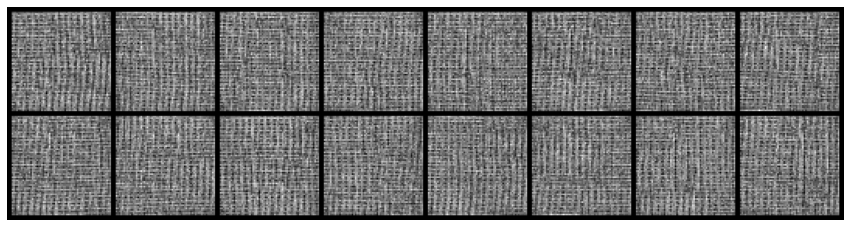

Epoch 61/100, time: 8.922000408172607s
Discriminator loss: 0.16929736733436584, Generator loss: 4.515106201171875
--------------------------------------------------------------------------------
Epoch 62/100, time: 8.963998317718506s
Discriminator loss: 0.13533253967761993, Generator loss: 4.5297441482543945
--------------------------------------------------------------------------------
Epoch 63/100, time: 8.90499997138977s
Discriminator loss: 0.13389086723327637, Generator loss: 4.2338151931762695
--------------------------------------------------------------------------------
Epoch 64/100, time: 8.87600040435791s
Discriminator loss: 0.15217946469783783, Generator loss: 4.5466203689575195
--------------------------------------------------------------------------------
Epoch 65/100, time: 8.92199969291687s
Discriminator loss: 0.19305941462516785, Generator loss: 3.981431007385254
--------------------------------------------------------------------------------


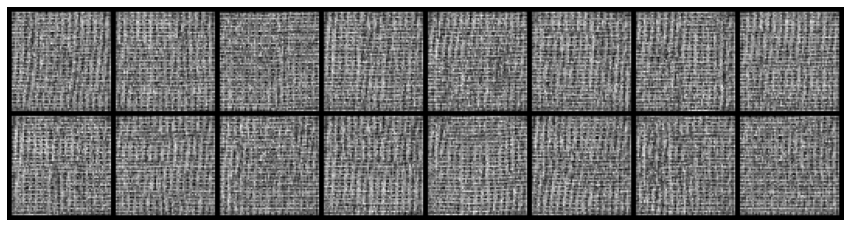

Epoch 66/100, time: 8.967995166778564s
Discriminator loss: 0.14281125366687775, Generator loss: 5.069572448730469
--------------------------------------------------------------------------------
Epoch 67/100, time: 8.875999212265015s
Discriminator loss: 0.1979677677154541, Generator loss: 6.04896354675293
--------------------------------------------------------------------------------
Epoch 68/100, time: 8.899998664855957s
Discriminator loss: 0.12942659854888916, Generator loss: 4.132359981536865
--------------------------------------------------------------------------------
Epoch 69/100, time: 9.085999965667725s
Discriminator loss: 0.18965084850788116, Generator loss: 4.217277526855469
--------------------------------------------------------------------------------
Epoch 70/100, time: 9.298818826675415s
Discriminator loss: 0.15148615837097168, Generator loss: 4.880399227142334
--------------------------------------------------------------------------------


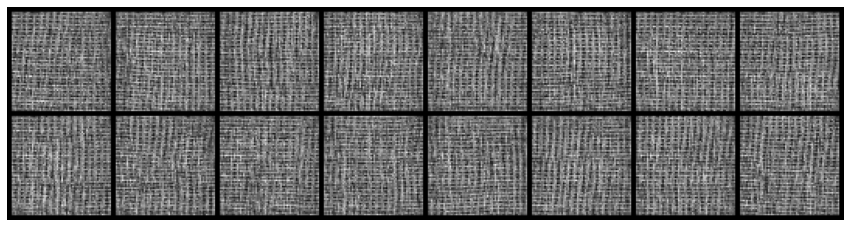

Epoch 71/100, time: 9.155508279800415s
Discriminator loss: 0.2366599142551422, Generator loss: 5.243290901184082
--------------------------------------------------------------------------------
Epoch 72/100, time: 9.254172801971436s
Discriminator loss: 0.14559084177017212, Generator loss: 3.554772138595581
--------------------------------------------------------------------------------
Epoch 73/100, time: 9.258338212966919s
Discriminator loss: 0.1349412202835083, Generator loss: 5.082589149475098
--------------------------------------------------------------------------------
Epoch 74/100, time: 9.0807523727417s
Discriminator loss: 0.19111967086791992, Generator loss: 4.013495445251465
--------------------------------------------------------------------------------
Epoch 75/100, time: 9.180180549621582s
Discriminator loss: 0.1904294192790985, Generator loss: 5.944879055023193
--------------------------------------------------------------------------------


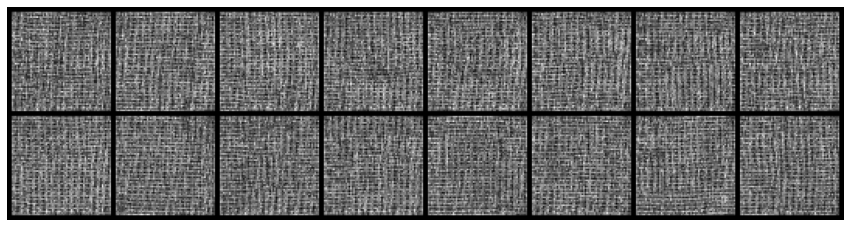

Epoch 76/100, time: 9.22281789779663s
Discriminator loss: 0.14226341247558594, Generator loss: 3.5446016788482666
--------------------------------------------------------------------------------
Epoch 77/100, time: 9.154844760894775s
Discriminator loss: 0.10608494281768799, Generator loss: 5.384655952453613
--------------------------------------------------------------------------------
Epoch 78/100, time: 9.235116481781006s
Discriminator loss: 0.08475031703710556, Generator loss: 4.4809160232543945
--------------------------------------------------------------------------------
Epoch 79/100, time: 9.100830078125s
Discriminator loss: 0.1322663277387619, Generator loss: 4.607377052307129
--------------------------------------------------------------------------------
Epoch 80/100, time: 9.204963445663452s
Discriminator loss: 0.1045110896229744, Generator loss: 4.866837978363037
--------------------------------------------------------------------------------


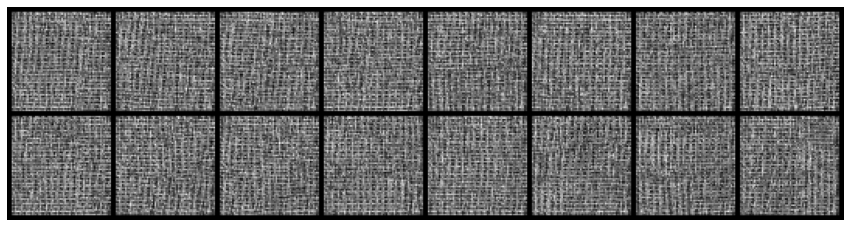

Epoch 81/100, time: 9.11269497871399s
Discriminator loss: 0.15297508239746094, Generator loss: 4.458259105682373
--------------------------------------------------------------------------------
Epoch 82/100, time: 9.096832513809204s
Discriminator loss: 0.15683630108833313, Generator loss: 4.262380123138428
--------------------------------------------------------------------------------
Epoch 83/100, time: 9.099845886230469s
Discriminator loss: 0.2131541669368744, Generator loss: 5.369509696960449
--------------------------------------------------------------------------------
Epoch 84/100, time: 9.118071556091309s
Discriminator loss: 0.0880509540438652, Generator loss: 7.935441493988037
--------------------------------------------------------------------------------
Epoch 85/100, time: 9.083673477172852s
Discriminator loss: 0.23809030652046204, Generator loss: 3.628230094909668
--------------------------------------------------------------------------------


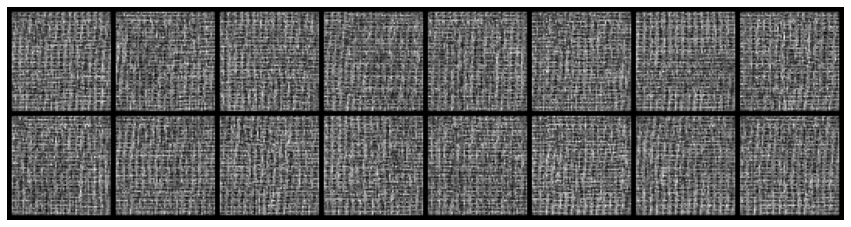

Epoch 86/100, time: 9.142913341522217s
Discriminator loss: 0.19770404696464539, Generator loss: 6.64993953704834
--------------------------------------------------------------------------------
Epoch 87/100, time: 9.245640516281128s
Discriminator loss: 0.1116434782743454, Generator loss: 4.488960266113281
--------------------------------------------------------------------------------
Epoch 88/100, time: 9.231932163238525s
Discriminator loss: 0.06599192321300507, Generator loss: 4.875749588012695
--------------------------------------------------------------------------------
Epoch 89/100, time: 9.087791919708252s
Discriminator loss: 0.08386882394552231, Generator loss: 5.058521270751953
--------------------------------------------------------------------------------
Epoch 90/100, time: 9.494170665740967s
Discriminator loss: 0.06696813553571701, Generator loss: 5.929417610168457
--------------------------------------------------------------------------------


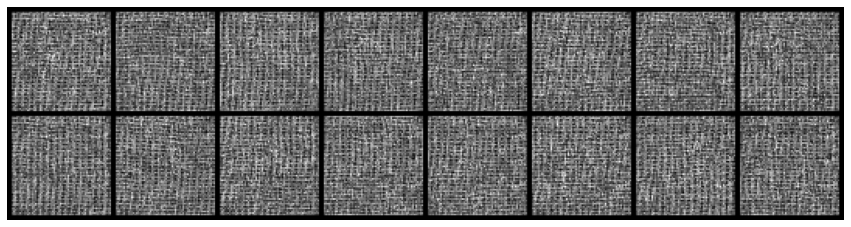

Epoch 91/100, time: 9.097999811172485s
Discriminator loss: 0.09600616246461868, Generator loss: 5.393067359924316
--------------------------------------------------------------------------------
Epoch 92/100, time: 9.150997400283813s
Discriminator loss: 0.0775858610868454, Generator loss: 5.750163555145264
--------------------------------------------------------------------------------
Epoch 93/100, time: 9.14399790763855s
Discriminator loss: 0.10758691281080246, Generator loss: 5.275484561920166
--------------------------------------------------------------------------------
Epoch 94/100, time: 9.18999981880188s
Discriminator loss: 0.06312359124422073, Generator loss: 4.931459426879883
--------------------------------------------------------------------------------
Epoch 95/100, time: 8.916552782058716s
Discriminator loss: 0.11826422810554504, Generator loss: 6.241790771484375
--------------------------------------------------------------------------------


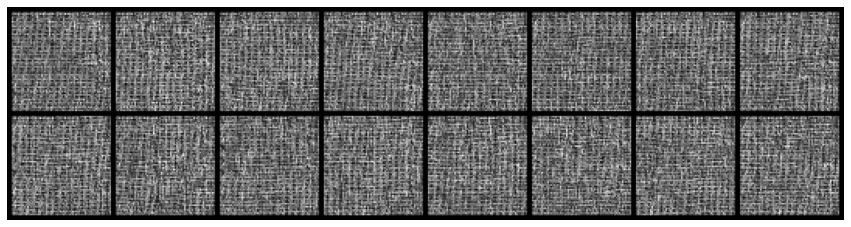

Epoch 96/100, time: 9.048588514328003s
Discriminator loss: 0.046033576130867004, Generator loss: 4.79234504699707
--------------------------------------------------------------------------------
Epoch 97/100, time: 9.007998704910278s
Discriminator loss: 0.14531418681144714, Generator loss: 7.240952491760254
--------------------------------------------------------------------------------
Epoch 98/100, time: 9.131999015808105s
Discriminator loss: 0.2928861379623413, Generator loss: 9.654960632324219
--------------------------------------------------------------------------------
Epoch 99/100, time: 9.091002941131592s
Discriminator loss: 0.07560136914253235, Generator loss: 6.2257280349731445
--------------------------------------------------------------------------------
Epoch 100/100, time: 9.331961631774902s
Discriminator loss: 0.08905872702598572, Generator loss: 5.576781749725342
--------------------------------------------------------------------------------


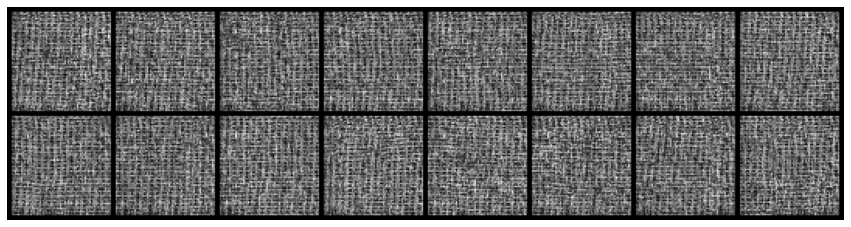

Total time for training is 918.1460754871368s


In [19]:
# train gan
generator.train()
discriminator.train()
# create losses list
d_loss_list, g_loss_list = [], []
# get start time
start_time = time.time()
# n_epochs 만큼 훈련 진행
for epoch in tqdm(range(n_epochs)):
    # get start time of each epoch
    initial_epoch_time = time.time()
    # train every batch
    for _, X_batch in enumerate(dataloader):
        """ train discriminator model """
        dis_optim.zero_grad()
        # step1: 판별자에 진짜 이미지를 입력, 라벨 생성
        X_real = X_batch.to(device)
        real_output = discriminator(X_real)
        real_label = torch.ones_like(real_output, device=device)
        # step2: 랜덤 노이즈 생성 32x128x1x1
        z = torch.randn(batch_size, latent_dim, 1, 1, device=device)
        # step3: 가짜 이미지를 생성하고 판별자에 입력
        X_fake = generator(z)
        fake_output = discriminator(X_fake)
        fake_label = torch.zeros_like(fake_output, device=device)
        # step4: 진짜 이미지와 가짜 이미지 로스를 구하고 옵티마이저 업데이트
        real_loss = loss_func(real_output, real_label)
        fake_loss = loss_func(fake_output, fake_label)
        d_loss = real_loss+fake_loss
        d_loss.backward()
        dis_optim.step()
        
        """ train generator model """
        for _ in range(2):
            gen_optim.zero_grad()
            # step1: 가짜 이미지 생성 후 판별자에 입력
            X_fake = generator(z)
            fake_output = discriminator(X_fake)
            # step2: 판별자를 속이기 위한 가짜 라벨 생성
            gen_label = torch.ones_like(fake_output, device=device)
            # step3: 로스 구하기 및 옵티마이저 업데이트
            g_loss = loss_func(fake_output, gen_label)
            g_loss.backward()
            gen_optim.step()
        
    d_loss_list.append(d_loss.item())
    g_loss_list.append(g_loss.item())
    # get end time of each epoch
    end_epoch_time = time.time()
    epoch_time = end_epoch_time-initial_epoch_time
    # print number of epoch and time and losses
    print(f'Epoch {epoch+1}/{n_epochs}, time: {epoch_time}s\n'
          f'Discriminator loss: {d_loss}, Generator loss: {g_loss}')
    print('--------------------------------------------------------------------------------')
    # plot generated images
    plot_generated_images(X_fake, epoch+1, 5)
end_time = time.time()
print(f'Total time for training is {end_time-start_time}s')

### Check Result of generated images

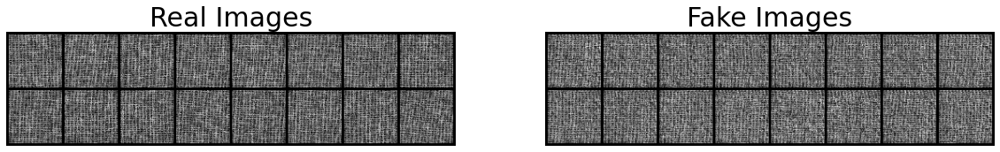

In [20]:
# compare with real images and generated images
plt.figure(figsize=(20,6))
plt.subplot(121)
# real images
real_images = np.transpose(vutils.make_grid(X_real.to(device),
                                            padding=3,
                                            normalize=True).cpu(), (1,2,0))
plt.imshow(real_images)
plt.axis('off')
plt.title('Real Images', size=30)
plt.subplot(122)
# fake images
fake_images = np.transpose(vutils.make_grid(X_fake.to(device),
                                            padding=3,
                                            normalize=True).cpu(), (1,2,0))
plt.imshow(fake_images)
plt.axis('off')
plt.title('Fake Images', size=30)
plt.show()

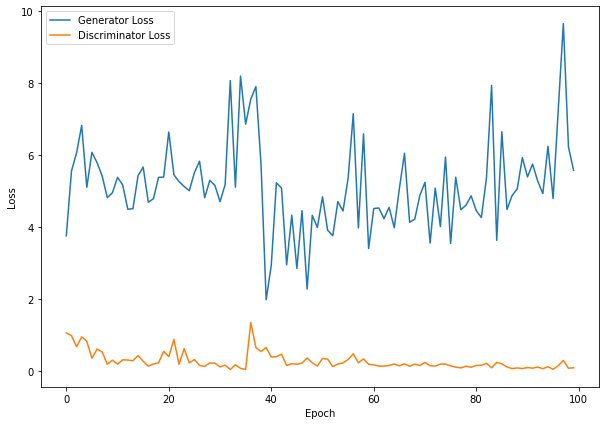

In [21]:
# check losses of networks
plt.figure(figsize=(10,7))
plt.plot(g_loss_list, label='Generator Loss')
plt.plot(d_loss_list, label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='best')
plt.show()

### Train Z vector

#### Residual Loss  
<img src = "https://blog.kakaocdn.net/dn/bqusWj/btq8as9T2D4/br6FX3KxIfu4S2lDxBc8lk/img.png" width=400>

In [22]:
# residual loss (real image와 fake image의 시각적 차이를 측정)
def residual_loss(real_image, fake_image):
    loss = real_image-fake_image
    return torch.sum(torch.abs(loss))

#### Discrimintation Loss  
<img src = "https://blog.kakaocdn.net/dn/ch0ySb/btq8bNytGgY/5Wqpz9yLktflT5WELxHd41/img.png" width=500>

In [23]:
# discriminator loss (feature map의 차이를 확인)
def discriminator_loss(real_image, fake_image):
    y_real = discriminator.extract_feature(real_image)
    y_fake = discriminator.extract_feature(fake_image)
    return torch.sum(torch.abs(y_real-y_fake))

#### Total Loass and anomaly score function  
<img src = "https://blog.kakaocdn.net/dn/cXw3u4/btq8a6ZAiKw/3cpTMWiRPB5ygQVzUkqKE1/img.png" width=500> 
<img src = "https://blog.kakaocdn.net/dn/xk1A3/btq79jF7u93/9g4HR9KYWkUcaQnOKSXHKk/img.png" width=500>

In [24]:
# anomaly loss (위의 residual loss와 discriminator loss의 weighted 합)
# 이를 anomaly score로도 쓸 것임 (어차피 식이 똑같은 의미를 지니기 때문에)
def anomaly_loss(residual_loss, discriminator_loss, lambda_=0.1):
    loss = (1-lambda_)*residual_loss+lambda_*discriminator_loss
    return loss

### Train latent Z and Compare anomaly score

In [25]:
# load anomalies and normal test set
target_size = target_size
batch_size = 1

transforms_ = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Normalize((0.5,),(0.5)),
    transforms.Resize(target_size),
])

In [31]:
# load nomrmal set
test_dir = './anogan_carpet_target/'

test_folder = ImageFolder(normal_dir,
                                 transform=transforms_,
                                 target_transform=None)

test_loader = DataLoader(test_normal_folder,
                                batch_size=batch_size,
                                shuffle=True,
                                drop_last=True)

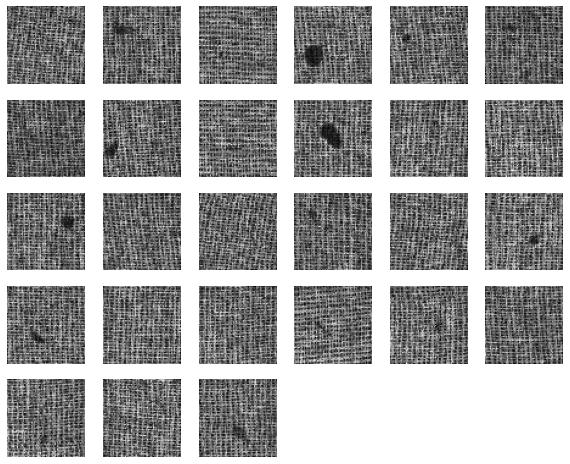

In [32]:
def show_samples(dataloader):
    n = int(np.ceil(np.sqrt(len(dataloader))))
    plt.figure(figsize=(10,10))
    for i, [image, _] in enumerate(dataloader):
        img = np.transpose(image[0], (1,2,0))
        plt.subplot(n,n,i+1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    plt.show()
    
show_samples(test_loader)

In [35]:
# latent vector Z를 훈련시키는 함수 정의
def train_latent_space(dataloader):
    # set Z and optimizer
    z = torch.randn(batch_size, latent_dim, 1, 1, device=device, requires_grad=True)
    optimizer_z = optim.Adam([z], lr=lr)
    
    latent_space = []
    anomaly_score = []
    
    for i, [image, _] in tqdm(enumerate(dataloader)):
        real_image = image.to(device)
        
        for step in range(10000):
            optimizer_z.zero_grad()
            # step1: 가짜 이미지 생성
            fake_image = generator(z)
            # step2: loss들 구하기
            res_loss = residual_loss(real_image, fake_image)
            dis_loss = discriminator_loss(real_image, fake_image)
            ano_loss = anomaly_loss(res_loss, dis_loss, lambda_=0.1)
            # step3: loss 및 optimizer 업데이트
            ano_loss.backward(retain_graph=True)
            optimizer_z.step()
            # print number of step and show losses
            if (step+1)%1000==0:
                print(f'{i+1} image, step [{step+1}]\n'
                      f'residual loss: {res_loss.item():.5}  '
                      f'discrimination loss: {dis_loss.item():.5}  '
                      f'anomaly loss: {ano_loss.item():.5}')
        latent_space.append(z.detach().cpu().numpy())
        anomaly_score.append(ano_loss.detach().cpu().numpy())
    
    return np.array(latent_space), np.array(anomaly_score)

In [36]:
# train Z about normal data
latent_space, anomaly_score = train_latent_space(test_normal_loader)

0it [00:00, ?it/s]

1 image, step [1000]
residual loss: 1270.7  discrimination loss: 2598.7  anomaly loss: 1403.5
1 image, step [2000]
residual loss: 1146.0  discrimination loss: 2313.5  anomaly loss: 1262.8
1 image, step [3000]
residual loss: 1067.8  discrimination loss: 2120.7  anomaly loss: 1173.1
1 image, step [4000]
residual loss: 1032.8  discrimination loss: 2037.6  anomaly loss: 1133.3
1 image, step [5000]
residual loss: 1011.7  discrimination loss: 1994.0  anomaly loss: 1110.0
1 image, step [6000]
residual loss: 999.05  discrimination loss: 1953.5  anomaly loss: 1094.5
1 image, step [7000]
residual loss: 989.16  discrimination loss: 1917.9  anomaly loss: 1082.0
1 image, step [8000]
residual loss: 980.77  discrimination loss: 1892.2  anomaly loss: 1071.9
1 image, step [9000]
residual loss: 974.33  discrimination loss: 1873.3  anomaly loss: 1064.2
1 image, step [10000]
residual loss: 969.83  discrimination loss: 1858.1  anomaly loss: 1058.7
2 image, step [1000]
residual loss: 1174.9  discrimination 

9 image, step [9000]
residual loss: 1005.3  discrimination loss: 1938.1  anomaly loss: 1098.6
9 image, step [10000]
residual loss: 1002.6  discrimination loss: 1924.6  anomaly loss: 1094.8
10 image, step [1000]
residual loss: 1129.8  discrimination loss: 2339.7  anomaly loss: 1250.8
10 image, step [2000]
residual loss: 1094.9  discrimination loss: 2261.7  anomaly loss: 1211.6
10 image, step [3000]
residual loss: 1063.1  discrimination loss: 2171.6  anomaly loss: 1174.0
10 image, step [4000]
residual loss: 1043.1  discrimination loss: 2096.6  anomaly loss: 1148.5
10 image, step [5000]
residual loss: 1028.7  discrimination loss: 2063.6  anomaly loss: 1132.1
10 image, step [6000]
residual loss: 1017.0  discrimination loss: 2024.6  anomaly loss: 1117.7
10 image, step [7000]
residual loss: 1010.2  discrimination loss: 1997.8  anomaly loss: 1109.0
10 image, step [8000]
residual loss: 1006.0  discrimination loss: 1989.7  anomaly loss: 1104.4
10 image, step [9000]
residual loss: 1003.7  discri

18 image, step [6000]
residual loss: 908.35  discrimination loss: 1685.7  anomaly loss: 986.08
18 image, step [7000]
residual loss: 905.71  discrimination loss: 1678.5  anomaly loss: 982.99
18 image, step [8000]
residual loss: 904.9  discrimination loss: 1674.2  anomaly loss: 981.82
18 image, step [9000]
residual loss: 904.13  discrimination loss: 1674.4  anomaly loss: 981.15
18 image, step [10000]
residual loss: 903.29  discrimination loss: 1673.8  anomaly loss: 980.34
19 image, step [1000]
residual loss: 989.89  discrimination loss: 2094.6  anomaly loss: 1100.4
19 image, step [2000]
residual loss: 957.83  discrimination loss: 2009.8  anomaly loss: 1063.0
19 image, step [3000]
residual loss: 945.22  discrimination loss: 1975.5  anomaly loss: 1048.2
19 image, step [4000]
residual loss: 937.33  discrimination loss: 1955.4  anomaly loss: 1039.1
19 image, step [5000]
residual loss: 927.87  discrimination loss: 1945.0  anomaly loss: 1029.6
19 image, step [6000]
residual loss: 923.05  discr

27 image, step [3000]
residual loss: 1016.2  discrimination loss: 1942.8  anomaly loss: 1108.9
27 image, step [4000]
residual loss: 1015.7  discrimination loss: 1937.7  anomaly loss: 1107.9
27 image, step [5000]
residual loss: 1015.6  discrimination loss: 1935.9  anomaly loss: 1107.6
27 image, step [6000]
residual loss: 1015.6  discrimination loss: 1936.0  anomaly loss: 1107.6
27 image, step [7000]
residual loss: 1015.5  discrimination loss: 1935.6  anomaly loss: 1107.5
27 image, step [8000]
residual loss: 1015.3  discrimination loss: 1936.1  anomaly loss: 1107.4
27 image, step [9000]
residual loss: 1015.3  discrimination loss: 1935.4  anomaly loss: 1107.3
27 image, step [10000]
residual loss: 1015.4  discrimination loss: 1933.8  anomaly loss: 1107.2


In [37]:
# array 변환
latent_space = np.array(latent_space)
anomaly_score = np.array(anomaly_score)

In [ ]:
# anomaly score의 kernel density discribution 살펴보기
plt.figure(figsize=(12,7))
sns.distplot(normal_data_anomaly_array, kde=True, rug=True, label='normal')
sns.distplot(anomaly_data_anomaly_array, kde=True, rug=True, label='anomaly')
plt.xlabel('anomaly score')
plt.legend(loc='best')
plt.show()

In [38]:
# 이미지를 입력하면 anomaly score가 출력되는 함수 생성
def compute_anomaly_score(input_image, z):
    input_image = input_image.to(device)
    z = z.to(device)
    fake_image = generator(z)
    feature_extract = discriminator.extract_feature(input_image)
    res_loss = residual_loss(input_image, fake_image)
    dis_loss = discriminator_loss(input_image, fake_image)
    ano_score = anomaly_loss(res_loss, dis_loss, lambda_=0.1)
    return ano_score, fake_image

In [39]:
# 이미지를 torch tensor gpu 버전에서 numpy array로 변환 및 [0,1] 스케일링 해주는 함수
def torch_to_array(image, add=False):
    if add==False:
        img = (image+1)/2
    else:
        img = (image-image.min())/(image-image.min()).max()
    img = np.transpose(img.detach().cpu().numpy(), (1,2,0))
    return img

In [40]:
# anomaly score 및 anomaly 부분 detection 시각화 함수
def compare_images(input_image, z, reverse):
    real_image = input_image.to(device)
    score, fake_image = compute_anomaly_score(input_image, z)
    
    if not reverse:
        diff_image = real_image-fake_image
    else:
        diff_image = fake_image-real_image
        
    real_image = real_image.reshape(1,64,64)
    fake_image = fake_image.reshape(1,64,64)
    diff_image = diff_image.reshape(1,64,64)
    
    anomaly_image = torch.zeros(size=(3,64,64), device=device)
    anomaly_image[0,:,:] = real_image-diff_image
    anomaly_image[1,:,:] = real_image-diff_image
    anomaly_image[2,:,:] = real_image-diff_image
    anomaly_image[0,:,:] = anomaly_image[0,:,:]+diff_image
    
    fig, axes = plt.subplots(1,4, figsize=(15,4))
    fig.suptitle(f'Anomaly score {score.item():.6}', size=20)
    axes[0].imshow(torch_to_array(real_image), cmap='gray')
    axes[0].axis('off')
    axes[0].set_title('Input Image')
    axes[1].imshow(torch_to_array(fake_image), cmap='gray')
    axes[1].axis('off')
    axes[1].set_title('Generated Image')
    axes[2].imshow(torch_to_array(diff_image, add=True), cmap='gray')
    axes[2].axis('off')
    axes[2].set_title('Difference')
    axes[3].imshow(torch_to_array(anomaly_image, add=True))
    axes[3].axis('off')
    axes[3].set_title('Anomaly Image')

In [41]:
def show_image_score(dataloader, latent_z):
    for i, [image, _] in enumerate(dataloader):
        image = image.to(device)
        update_z = torch.Tensor(latent_z[i]).to(device)
        
        compare_images(image, update_z, reverse=True)

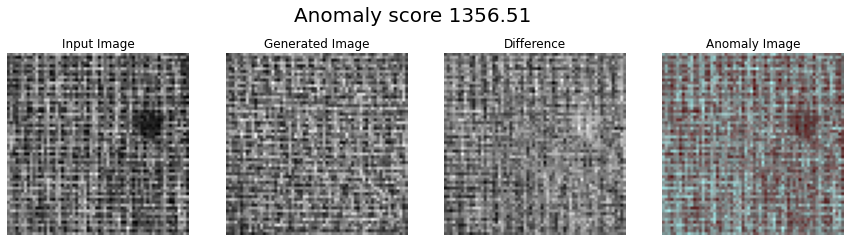

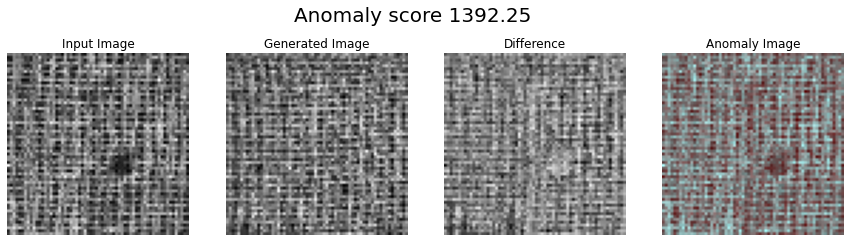

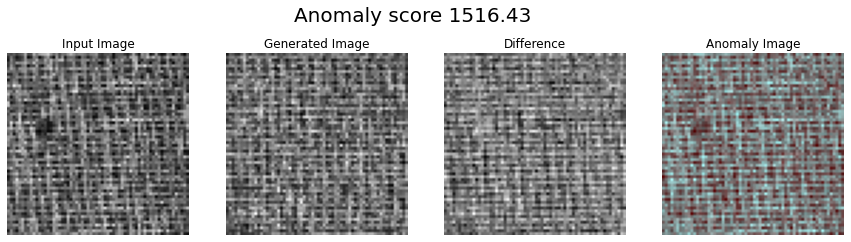

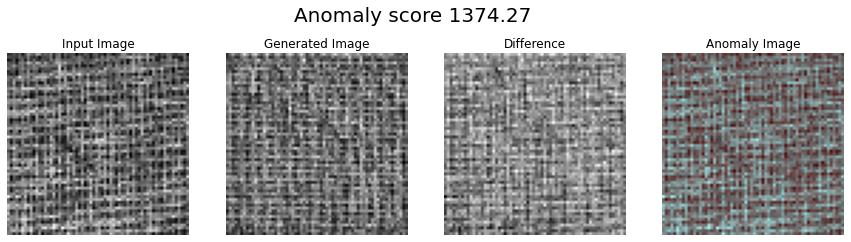

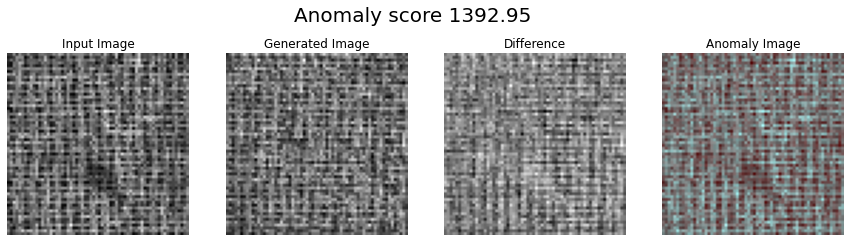

...

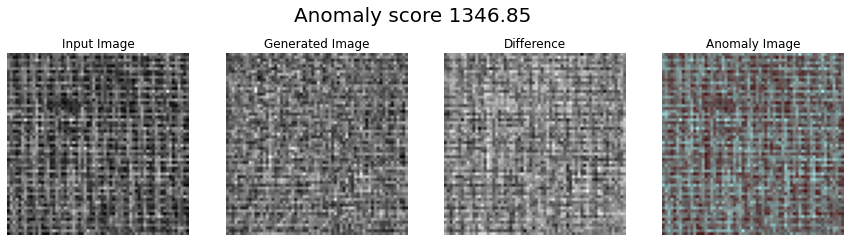

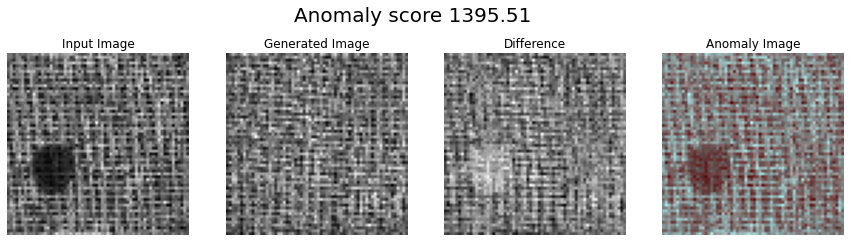

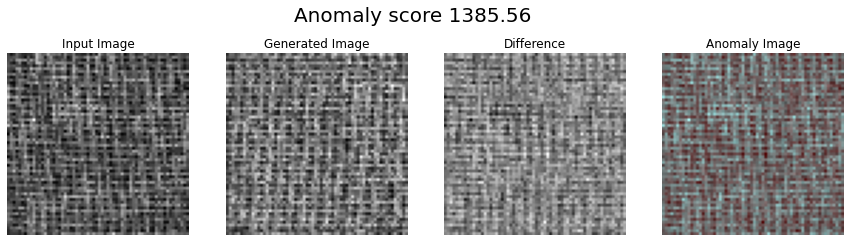

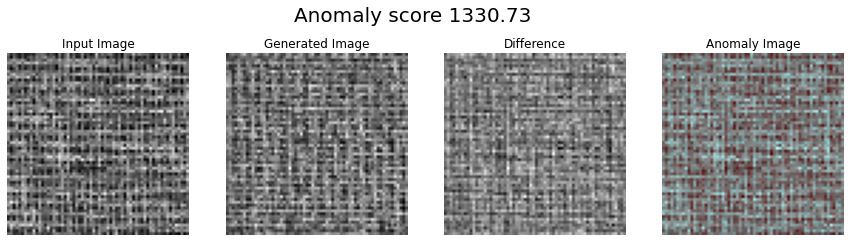

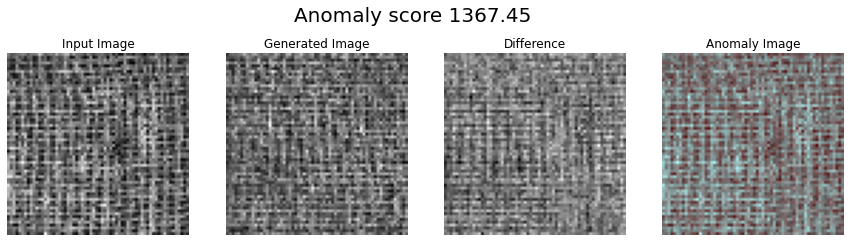

In [42]:
show_image_score(test_normal_loader, latent_space)